# Evaluate FlowNet and DispNet for disparity evaluation

To evaluate the FlowNetS, FlowNetC, DispNetS and DispNetC for disparity evaluation on FlyingThings3D, we use the function eval() from the file eval.py. 

In [1]:
from eval import evaluate, setup_args
import pandas as pd
import numpy as np
from pathlib import Path
import sys
sys.argv = ['']

## FlowNetS

The following block will evaluate a FlowNetS with the provided pre-trained weights on the FlyingThings3D test set. Note that the evaluation may run for several minutes. Have a look at the qualitative results by using tensorboard on the specified output directory.

The function will try to load existing results instead of running the evaluation. To run the evaluations in the **command line instead of the notebook**, run:

~~~bash
python eval.py --model FlowNetS --auto_restore mw/flownets --output output/flownets
python eval.py --model FlowNetC --auto_restore mw/flownetc --output output/flownetc
python eval.py --model DispNetS --auto_restore mw/dispnets --output output/dispnets
python eval.py --model DispNetC --auto_restore mw/dispnetc --output output/dispnetc
~~~

Then download the results and move them s.t. they are found by the `run_or_get_output` function below.

In [2]:
OUTPUT_DIR = "output"


def run_or_get_output(args):
    output_dir = Path(args.output) / "eval" / "FlyingThings3D"
    metrics_file = output_dir / "metrics.csv"
    results_file = output_dir / "results.csv"
    if metrics_file.is_file() and results_file.is_file():
        print(f"Loading results from {output_dir}")
        metrics = pd.read_csv(metrics_file, index_col=0)
        # pandas save Series as DataFrame but we want to load it as Series again
        results_df = pd.read_csv(results_file, index_col=0)
        indx = results_df.index
        vals = [results_df.iloc[i, 0] for i in range(len(indx))]
        results = pd.Series(vals, index=indx)
    else:
        print(f"Computing results with arguments {args}")
        metrics, results = evaluate(args)
    return metrics, results
    
args = setup_args()
args.model = "FlowNetS"
args.auto_restore = "mw/flownets"
args.output = f"{OUTPUT_DIR}/flownets"
flownet_s_metrics, flownet_s_results = run_or_get_output(args)

Computing results with arguments Namespace(C=48, auto_restore='mw/flownets', batch_size=1, dataset='FlyingThings3D', device='cuda', model='FlowNetS', num_workers=4, output='output/flownets', restore=None)
Initializing evaluation.
	Model: FlowNetS (feature dimensionality: 48)
	Evaluation dataset: FlyingThings3D
	Restore from checkpoint: /misc/lmbssd/gings/cv_shared_data/model_weights/flownet_s_c48_chairs_short.pt
	Output directory: output/flownets

Initializing dataset FlyingThings3DTest from /misc/lmbssd/gings/cv_shared_data/FlyingThings3D/TEST.
	Number of samples: 4248
Finished initializing dataset FlyingThings3DTest.

Restoring model weights from /misc/lmbssd/gings/cv_shared_data/model_weights/flownet_s_c48_chairs_short.pt

Sample 100/4248 - 0.09s per sample - metrics:
	metric
	epe    17.339521
RAM 3.4/62.8 GPU NVIDIA GeForce GTX 1080 Ti Util 42% UMem 10% Mem 1.2/10.9 Temp 44°C
Sample 200/4248 - 0.08s per sample - metrics:
	metric
	epe    33.858604
RAM 3.4/62.8 GPU NVIDIA GeForce GTX

The metrics for each sample and the averaged results are returned as pandas Seris and Dataframes, which can be directly displayed by Jupyter notebook as tables and be easily plotted with matplotlib. 

In [3]:
flownet_s_metrics

metric,epe
sample,
0,5.980202
1,7.971443
2,12.216593
3,15.555386
4,13.170818
...,...
4243,7.558125
4244,7.570299
4245,9.476730


In [4]:
flownet_s_results

metric
epe    10.026416
dtype: float64

<AxesSubplot: xlabel='sample'>

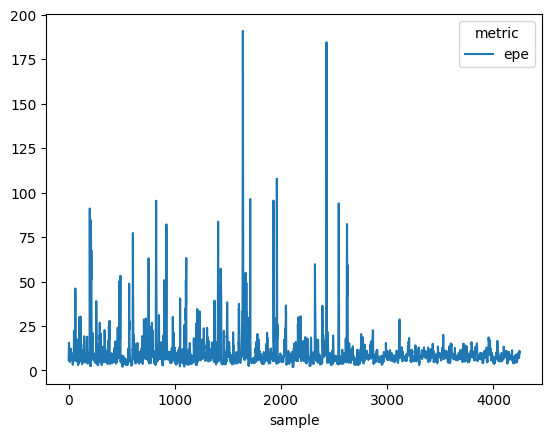

In [5]:
flownet_s_metrics.plot()

## FlowNetC

In [6]:
args = setup_args()
args.model = "FlowNetC"
args.auto_restore = "mw/flownetc"
args.output = f"{OUTPUT_DIR}/flownetc"
flownet_c_metrics, flownet_c_results = run_or_get_output(args)

Computing results with arguments Namespace(C=48, auto_restore='mw/flownetc', batch_size=1, dataset='FlyingThings3D', device='cuda', model='FlowNetC', num_workers=4, output='output/flownetc', restore=None)
Initializing evaluation.
	Model: FlowNetC (feature dimensionality: 48)
	Evaluation dataset: FlyingThings3D
	Restore from checkpoint: /misc/lmbssd/gings/cv_shared_data/model_weights/flownet_c_c48_chairs_short.pt
	Output directory: output/flownetc

Using Python correlation layer.

Initializing dataset FlyingThings3DTest from /misc/lmbssd/gings/cv_shared_data/FlyingThings3D/TEST.
	Number of samples: 4248
Finished initializing dataset FlyingThings3DTest.

Restoring model weights from /misc/lmbssd/gings/cv_shared_data/model_weights/flownet_c_c48_chairs_short.pt

Sample 100/4248 - 0.33s per sample - metrics:
	metric
	epe    10.934816
RAM 3.7/62.8 GPU NVIDIA GeForce GTX 1080 Ti Util 33% UMem 16% Mem 1.6/10.9 Temp 59°C
Sample 200/4248 - 0.29s per sample - metrics:
	metric
	epe    52.006374
RA

In [7]:
print(flownet_c_results)

metric
epe    8.508744
dtype: float64


## DispNetS

In [8]:
args = setup_args()
args.model = "DispNetS"
args.auto_restore = "mw/dispnets"
args.output = f"{OUTPUT_DIR}/dispnets"
dispnet_s_metrics, dispnet_s_results = run_or_get_output(args)

Computing results with arguments Namespace(C=48, auto_restore='mw/dispnets', batch_size=1, dataset='FlyingThings3D', device='cuda', model='DispNetS', num_workers=4, output='output/dispnets', restore=None)
Initializing evaluation.
	Model: DispNetS (feature dimensionality: 48)
	Evaluation dataset: FlyingThings3D
	Restore from checkpoint: /misc/lmbssd/gings/cv_shared_data/model_weights/dispnet_s_c48_things_short.pt
	Output directory: output/dispnets

Initializing dataset FlyingThings3DTest from /misc/lmbssd/gings/cv_shared_data/FlyingThings3D/TEST.
	Number of samples: 4248
Finished initializing dataset FlyingThings3DTest.

Restoring model weights from /misc/lmbssd/gings/cv_shared_data/model_weights/dispnet_s_c48_things_short.pt

Sample 100/4248 - 0.08s per sample - metrics:
	metric
	epe    2.865297
RAM 3.6/62.8 GPU NVIDIA GeForce GTX 1080 Ti Util 56% UMem 12% Mem 1.6/10.9 Temp 56°C
Sample 200/4248 - 0.08s per sample - metrics:
	metric
	epe    7.113161
RAM 3.6/62.8 GPU NVIDIA GeForce GTX 1

In [9]:
print(dispnet_s_results)

metric
epe    2.22556
dtype: float64


## DispNetC

In [10]:
args = setup_args()
args.model = "DispNetC"
args.auto_restore = "mw/dispnetc"
args.output = f"{OUTPUT_DIR}/dispnetc"
dispnet_c_metrics, dispnet_c_results = run_or_get_output(args)

Computing results with arguments Namespace(C=48, auto_restore='mw/dispnetc', batch_size=1, dataset='FlyingThings3D', device='cuda', model='DispNetC', num_workers=4, output='output/dispnetc', restore=None)
Initializing evaluation.
	Model: DispNetC (feature dimensionality: 48)
	Evaluation dataset: FlyingThings3D
	Restore from checkpoint: /misc/lmbssd/gings/cv_shared_data/model_weights/dispnet_c_c48_things_short.pt
	Output directory: output/dispnetc

Using Python correlation layer.

Initializing dataset FlyingThings3DTest from /misc/lmbssd/gings/cv_shared_data/FlyingThings3D/TEST.
	Number of samples: 4248
Finished initializing dataset FlyingThings3DTest.

Restoring model weights from /misc/lmbssd/gings/cv_shared_data/model_weights/dispnet_c_c48_things_short.pt

Sample 100/4248 - 0.10s per sample - metrics:
	metric
	epe    2.09696
RAM 3.6/62.8 GPU NVIDIA GeForce GTX 1080 Ti Util 45% UMem 15% Mem 1.6/10.9 Temp 65°C
Sample 200/4248 - 0.09s per sample - metrics:
	metric
	epe    3.631754
RAM 3

If your correlation layer implementation from the previous task was correct, this should give an EPE of 1.67.

In [11]:
print(dispnet_c_results)

metric
epe    1.665476
dtype: float64


## Comparison

Now that results are available for all four models, we want to compare results. Your task is to show the results as table and plot them as shown on the assignment sheet.
For this, you have to combine the pandas Series/DataFrames that contain the metrics/results of each model. Have a look at the pandas documentation and make use of the notebook to quickly try and check commands. 

In [12]:
flownet_s_results

metric
epe    10.026416
dtype: float64

In [13]:
{
    'FlowNetS': flownet_s_results, 
    'FlowNetC': flownet_c_results,
    'DispNetS': dispnet_s_results,
    'DispNetC': dispnet_c_results,
}

{'FlowNetS': metric
 epe    10.026416
 dtype: float64,
 'FlowNetC': metric
 epe    8.508744
 dtype: float64,
 'DispNetS': metric
 epe    2.22556
 dtype: float64,
 'DispNetC': metric
 epe    1.665476
 dtype: float64}

In [14]:
# START TODO #################
# Combine the flownet_s_metrics, flownet_c_metrics, dispnet_s_metrics and dispnet_c_metrics 
# to a pandas DataFrame called combined_metrics.
# Combine the flownet_s_results, flownet_c_results, dispnet_s_results and dispnet_c_results 
# to a pandas DataFrame called combined_results.
# combined_metrics = ...
# combined_results = ...
combined_metrics = pd.DataFrame.from_dict({'FlowNetS': flownet_s_metrics['epe'], 
                                           'FlowNetC': flownet_c_metrics['epe'],
                                           'DispNetS': dispnet_s_metrics['epe'], 
                                           'DispNetC': dispnet_c_metrics['epe'],})
combined_results = pd.DataFrame.from_dict({'FlowNetS': flownet_s_results, 
                                           'FlowNetC': flownet_c_results,
                                           'DispNetS': dispnet_s_results,
                                           'DispNetC': dispnet_c_results,}).T
combined_results.index.name = 'Model'
# END TODO #################

Show the combined metrics:

In [15]:
combined_metrics

,FlowNetS,FlowNetC,DispNetS,DispNetC
sample,,,,
0,5.980202,5.211526,1.519313,1.225642
1,7.971443,7.162177,2.131133,1.810591
2,12.216593,10.495967,3.611868,3.394582
3,15.555386,13.868244,4.602033,3.413465
4,13.170818,10.815986,3.618641,3.112459
...,...,...,...,...
4243,7.558125,6.038706,2.006345,1.340064
4244,7.570299,6.200523,2.172725,1.486826
4245,9.476730,6.561542,2.044693,1.546303


<AxesSubplot: xlabel='sample', ylabel='EPE'>

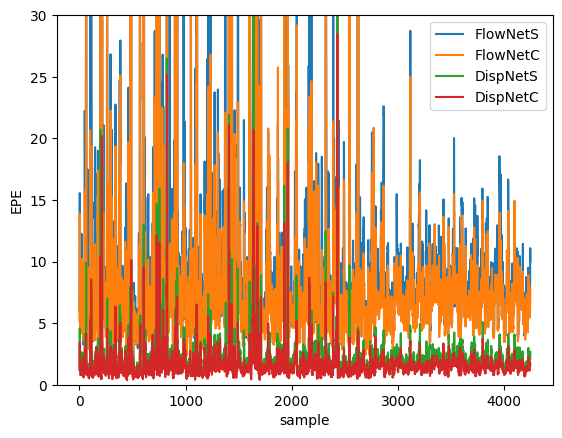

In [16]:
combined_metrics.plot(ylabel="EPE", ylim=(0,30))

Show the combined results:

In [17]:
combined_results

metric,epe
Model,
FlowNetS,10.026416
FlowNetC,8.508744
DispNetS,2.225560
DispNetC,1.665476


<AxesSubplot: title={'center': 'Evaluation on FlyingThings3D'}, xlabel='Model', ylabel='EPE'>

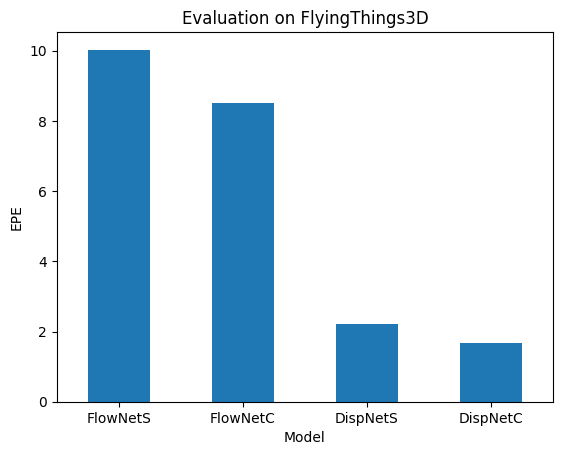

In [18]:
# START TODO #################
# Create the bar plot as shown in Figure 3b of the assignment sheet.
combined_results.plot.bar(rot=0, ylabel='EPE', legend=False, title="Evaluation on FlyingThings3D")
# END TODO #################

## Rectification

See the assignment PDF for details, chapter *Apply DispNet to images from a monocular camera*.

In [19]:
import os.path as osp
from importlib import reload
from PIL import Image
from lib.vis import np2d, np3d
import lib.utils as utils

In [20]:
def load_data(path):
    path_l = osp.join(path, "left.png")
    path_r = osp.join(path, "right.png")

    image_l = np.array(Image.open(path_l)).transpose([2,0,1])  # 3, H, W
    image_r = np.array(Image.open(path_r)).transpose([2,0,1])  # 3, H, W
    _, h_orig, w_orig = image_l.shape

    K = np.load(osp.join(path, 'K.npy'))
    r_to_l_transform = np.load(osp.join(path, 'right_to_left_transform.npy'))
    return image_l, image_r, K, r_to_l_transform

First we implement some basic functions for:
- projecting a 3d point to an image
- computing the epipole from another camera in a current image
- computing the essential and fundamental matrices

### KITTI 1

In [21]:
path = "data/kitti"
image_l, image_r, K, r_to_l_transform = load_data(path)

First we simply visualize the images:

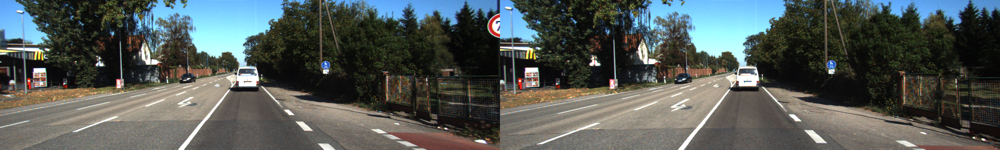

In [22]:
np3d(np.concatenate([image_l, image_r], -1), image_range_text_off=True)

Note that the images are actually not left and right images from a stereo camera pair! Instead the images are from a video with forward motion between the first and second image. We still call the first image image_l and the second image image_r, as this is how the DispNet will interpret the images.

Next we compute the epipoles in both images and visualize them in the images.

In [23]:
reload(utils)
epi_in_r = utils.get_epipole(K, r_to_l_transform)
epi_in_l = utils.get_epipole(K, utils.invert_transform(r_to_l_transform))

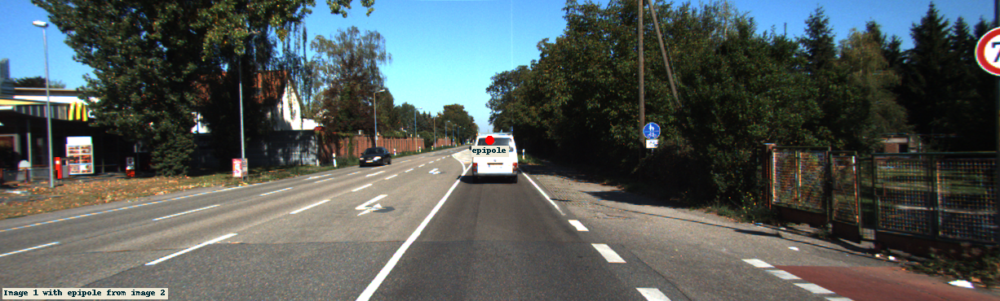

In [24]:
np3d(image_l, markers=[{'xy_pos': epi_in_l, 'desc': "epipole"}], 
     text="Image 1 with epipole from image 2", image_range_text_off=True)

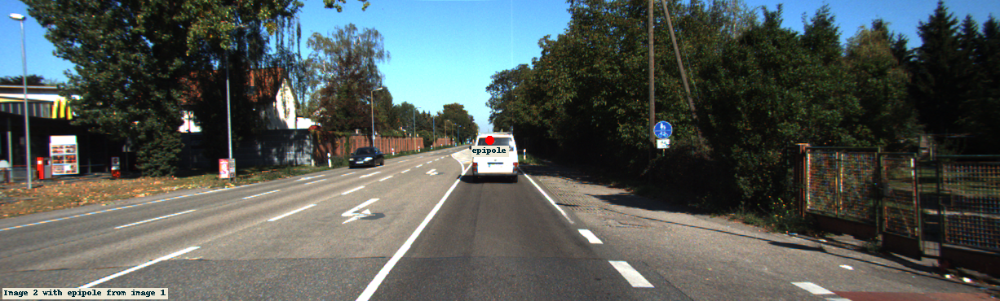

In [25]:
np3d(image_r, markers=[{'xy_pos': epi_in_r, 'desc': "epipole"}], 
     text="Image 2 with epipole from image 1", image_range_text_off=True)

Note that the epipole from image 1 is within the image plane of image 2 even though the camera from image 2 is *behind* the image plane of image 1. This simply is because mathematically also points behind the image plane can be projected onto the image plane and we did not check this.

Next we can visualize some epipolar lines in the second image. For this, we need to compute the fundamental matrix from the known camera calibration. We call the fundamental matrix F_l_to_r, as it gives us an epipolar line l=Fx in the right (=second) image given a point x in the left (=first) image.

In [26]:
reload(utils)
F_l_to_r = utils.compute_fundamental_matrix(K, r_to_l_transform)
F_l_to_r

array([[ 1.65946717e-03,  1.35022059e+00, -2.34341008e+02],
       [-1.35020709e+00,  1.65432644e-03,  8.10127992e+02],
       [ 2.31668857e+02, -8.10590555e+02,  1.03515897e+03]])

It is also possible to compute the fundamental matrix from the essential matrix. Here, we use this as a sanity check:

In [27]:
reload(utils)
E_l_to_r = utils.compute_essential_matrix(r_to_l_transform)
F_l_to_r_check = np.linalg.inv(K.T).dot(E_l_to_r).dot(np.linalg.inv(K))
F_l_to_r_check

array([[ 3.31908060e-09,  2.70056020e-06, -4.68702673e-04],
       [-2.70053319e-06,  3.30879869e-09,  1.62032739e-03],
       [ 4.63358133e-04, -1.62125256e-03,  2.07040918e-03]])

On first glance the fundamental matrix that was computed from the essential matrix looks different. But keep in mind that the fundamental matrix is defined only up to scale, so it is okay if both matrices differ by a fixed scale factor:

In [28]:
F_l_to_r_check / F_l_to_r

array([[2.00008814e-06, 2.00008814e-06, 2.00008814e-06],
       [2.00008814e-06, 2.00008814e-06, 2.00008814e-06],
       [2.00008814e-06, 2.00008814e-06, 2.00008814e-06]])

We can now use the fundamental matrix to visualize epipolar lines in the second image for reference points in the first image:

In [29]:
reload(utils)
x_ref_0 = (96, 130)
x_ref_1 = (290, 300)
color_0 = (0, 255, 0)
color_1 = (0, 0, 255)
image_r_epilines = utils.plot_epipolar_line(image_r, F_l_to_r, x_ref=x_ref_0, line_color=color_0)
image_r_epilines = utils.plot_epipolar_line(image_r_epilines, F_l_to_r, x_ref=x_ref_1, line_color=color_1)

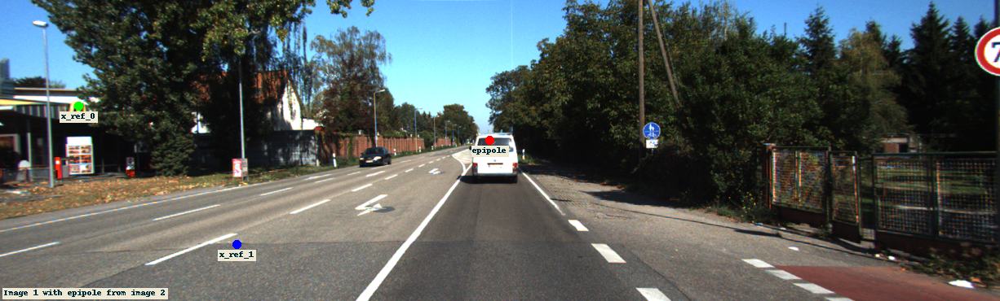

In [30]:
np3d(image_l, markers=[{'xy_pos': epi_in_l, 'desc': "epipole"}, 
                       {'xy_pos': x_ref_0, 'desc': "x_ref_0", 'marker_color':color_0}, 
                       {'xy_pos': x_ref_1, 'desc': "x_ref_1", 'marker_color':color_1}], 
     text="Image 1 with epipole from image 2", image_range_text_off=True)

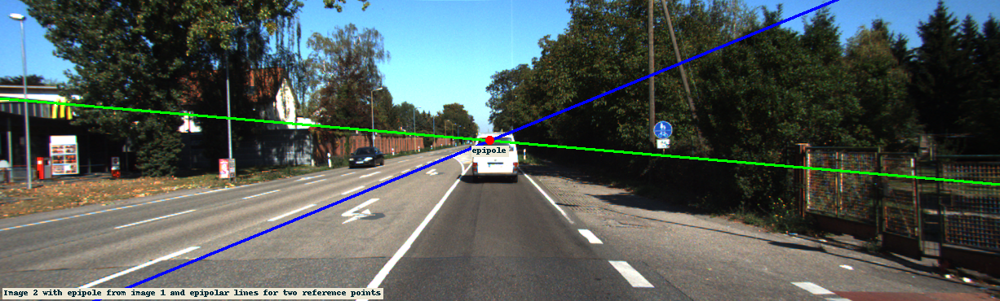

In [31]:
np3d(image_r_epilines, markers=[{'xy_pos': epi_in_r, 'desc': "epipole"}], 
     text="Image 2 with epipole from image 1 and epipolar lines for two reference points", 
     image_range_text_off=True)

You can visualize check that the epipolar lines cross the corresponding points of the two referents points in the first image.

### KITTI 2

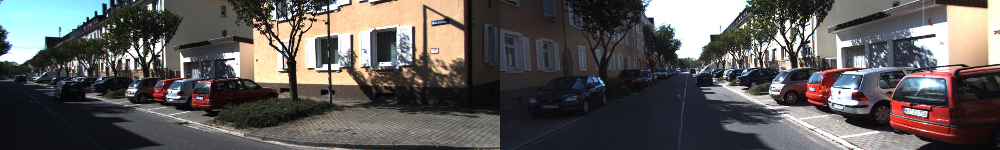

In [32]:
path = "data/kitti_2"
image_l, image_r, K, r_to_l_transform = load_data(path)
np3d(np.concatenate([image_l, image_r], -1), image_range_text_off=True)

In [33]:
epi_in_r = utils.get_epipole(K, r_to_l_transform)
epi_in_l = utils.get_epipole(K, utils.invert_transform(r_to_l_transform))
F_l_to_r = utils.compute_fundamental_matrix(K, r_to_l_transform)

In [34]:
reload(utils)
x_ref_0 = (310, 230)
x_ref_1 = (480, 240)
color_0 = (0, 255, 0)
color_1 = (0, 0, 255)
image_r_epilines = utils.plot_epipolar_line(image_r, F_l_to_r, x_ref=x_ref_0, line_color=color_0)
image_r_epilines = utils.plot_epipolar_line(image_r_epilines, F_l_to_r, x_ref=x_ref_1, line_color=color_1)

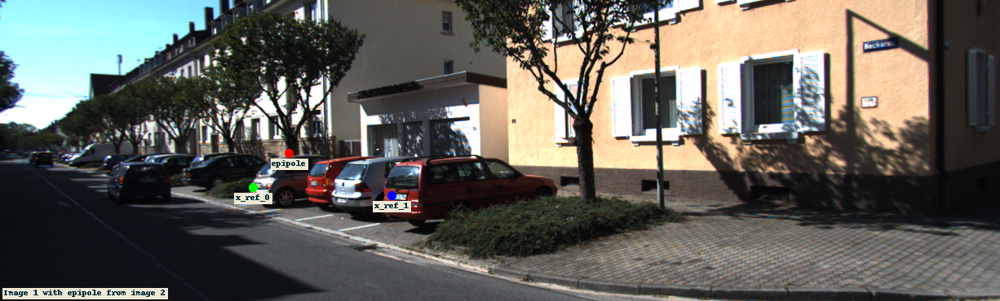

In [35]:
np3d(image_l, markers=[{'xy_pos': epi_in_l, 'desc': "epipole"}, {'xy_pos': x_ref_0, 'desc': "x_ref_0", 'marker_color':color_0}, {'xy_pos': x_ref_1, 'desc': "x_ref_1", 'marker_color':color_1}], text="Image 1 with epipole from image 2", image_range_text_off=True)

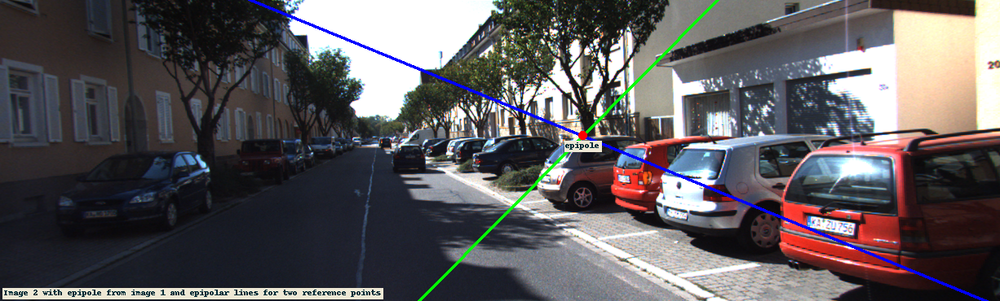

In [36]:
np3d(image_r_epilines, markers=[{'xy_pos': epi_in_r, 'desc': "epipole"}], text="Image 2 with epipole from image 1 and epipolar lines for two reference points", image_range_text_off=True)

### RealThings

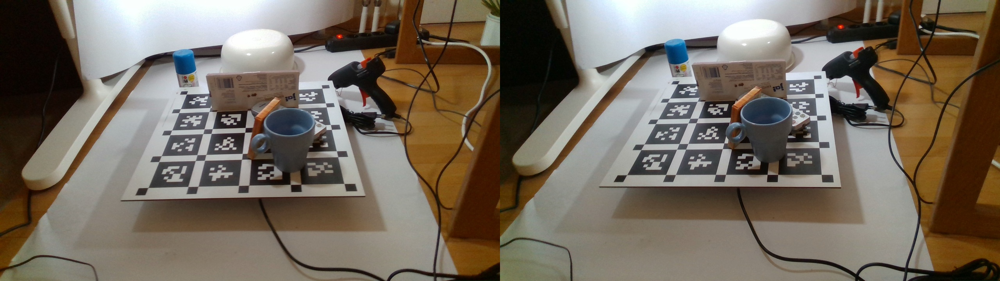

In [37]:
path = "data/realthings"
image_l, image_r, K, r_to_l_transform = load_data(path)
np3d(np.concatenate([image_l, image_r], -1), image_range_text_off=True)

In [38]:
epi_in_r = utils.get_epipole(K, r_to_l_transform)
epi_in_l = utils.get_epipole(K, utils.invert_transform(r_to_l_transform))
F_l_to_r = utils.compute_fundamental_matrix(K, r_to_l_transform)

In [39]:
reload(utils)
x_ref_0 = (480, 200)
x_ref_1 = (690, 370)
color_0 = (0, 255, 0)
color_1 = (0, 0, 255)
image_r_epilines = utils.plot_epipolar_line(image_r, F_l_to_r, x_ref=x_ref_0, line_color=color_0)
image_r_epilines = utils.plot_epipolar_line(image_r_epilines, F_l_to_r, x_ref=x_ref_1, line_color=color_1)

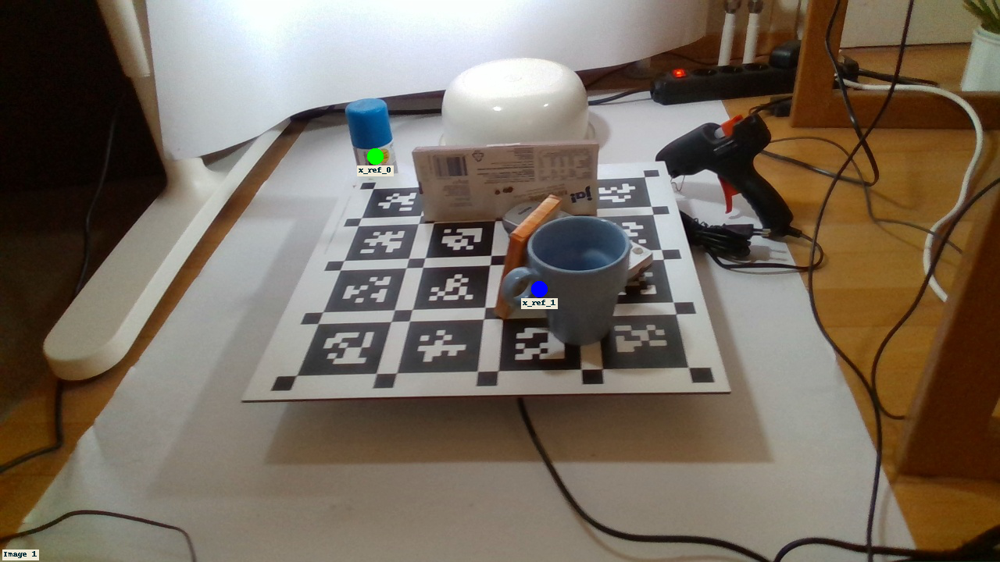

In [40]:
np3d(image_l, markers=[{'xy_pos': epi_in_l, 'desc': "epipole"}, {'xy_pos': x_ref_0, 'desc': "x_ref_0", 'marker_color':color_0}, {'xy_pos': x_ref_1, 'desc': "x_ref_1", 'marker_color':color_1}], text="Image 1", image_range_text_off=True)

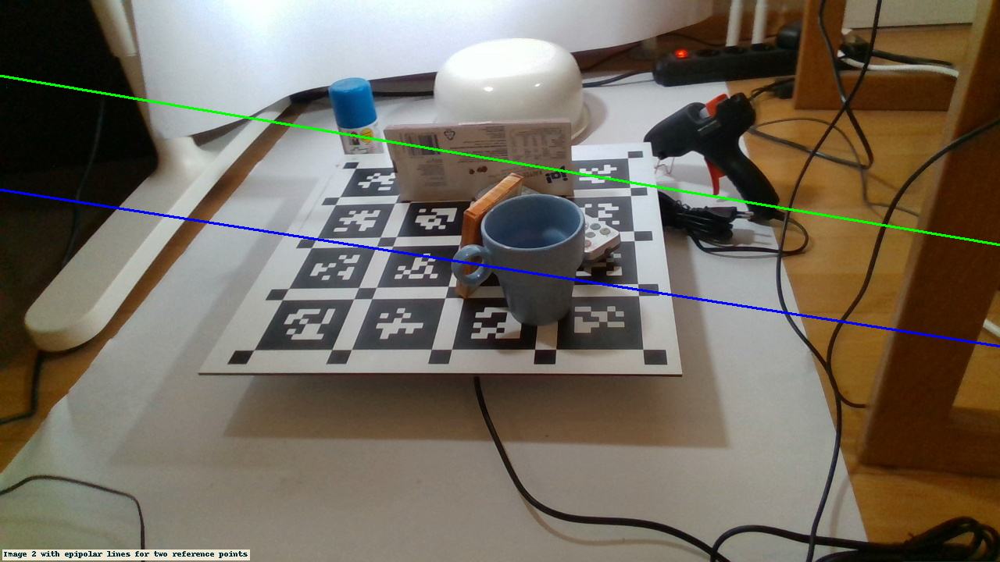

In [41]:
np3d(image_r_epilines, markers=[{'xy_pos': epi_in_r, 'desc': "epipole"}], text="Image 2 with epipolar lines for two reference points", image_range_text_off=True)

Note that for this image pair the epipoles are out of the image boundaries:

In [42]:
epi_in_l

array([7792.20389783, 1374.17223298])

In [43]:
epi_in_r

array([11990.52772625,  2122.93936854])

### Rectification

We will work with the RealThings image pair for the following rectification.

In [44]:
reload(utils)
image_l_rect, image_r_rect, H_l, H_r, rrect_to_lrect_transform = utils.rectify_images(image_l, image_r, K, r_to_l_transform)

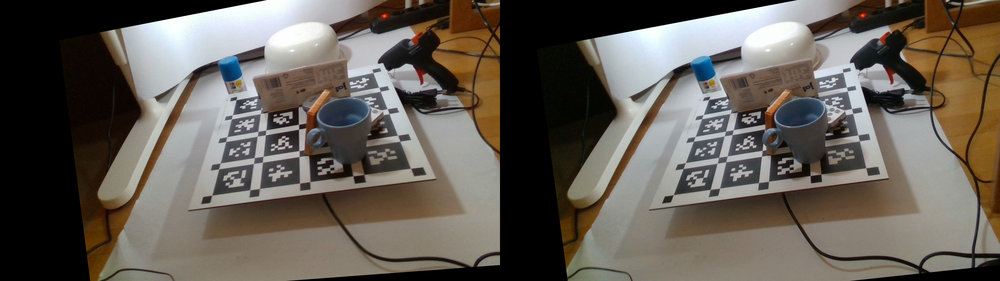

In [45]:
np3d(np.concatenate([image_l_rect, image_r_rect], -1), image_range_text_off=True)

Next we can verify that epipolar lines are horizontal by visualizing the epipolar lines for the same reference points as before. Note that the reference point coordinates also changed, as the left image was warped too:

We can check that after rectification the epipoles are at infinity (i.e. (f, 0, 0) in homogeneous coordinates) and the fundamental matrix is of the form i_x where i=(1, 0, 0) and the i_x is the corresponding skew-symmetric matrix that represents a cross product:

In [46]:
epi_in_r = utils.get_epipole(K, rrect_to_lrect_transform, return_hom=True)
epi_in_l = utils.get_epipole(K, utils.invert_transform(rrect_to_lrect_transform), return_hom=True)
F_lrect_to_rrect = utils.compute_fundamental_matrix(K, rrect_to_lrect_transform)

print("Epipole in left image: {}.".format(epi_in_l))
print("Epipole in right image: {}.".format(epi_in_r))
print("Fundamental matrix: \n{}.".format(F_lrect_to_rrect/F_lrect_to_rrect[1,2]))

Epipole in left image: [ 6.31342633e+01 -1.72325059e-01 -1.63220321e-03].
Epipole in right image: [-6.31342626e+01  1.72325120e-01  1.63220354e-03].
Fundamental matrix: 
[[-8.07953177e-14 -2.58528955e-05  2.72950148e-03]
 [ 2.58529031e-05  2.66587869e-11  1.00000000e+00]
 [-2.72950623e-03 -9.99999970e-01 -3.51705680e-05]].


In [47]:
x_ref_0_rect = H_l.dot(np.append(np.array(x_ref_0), 1))
x_ref_0_rect = np.array([x_ref_0_rect[0]/x_ref_0_rect[2], x_ref_0_rect[1]/x_ref_0_rect[2]])
x_ref_1_rect = H_l.dot(np.append(np.array(x_ref_1), 1))
x_ref_1_rect = np.array([x_ref_1_rect[0]/x_ref_1_rect[2], x_ref_1_rect[1]/x_ref_1_rect[2]])
print("Reference point 0 was at {} and is at {} after rectification.".format(x_ref_0, x_ref_0_rect))
print("Reference point 1 was at {} and is at {} after rectification.".format(x_ref_1, x_ref_1_rect))

image_r_rect_epilines = utils.plot_epipolar_line(
    image_r_rect, F_lrect_to_rrect, x_ref=x_ref_0_rect, line_color=color_0)
image_r_rect_epilines = utils.plot_epipolar_line(
    image_r_rect_epilines, F_lrect_to_rrect, x_ref=x_ref_1_rect, line_color=color_1)

Reference point 0 was at (480, 200) and is at [601.87012324 215.25652482] after rectification.
Reference point 1 was at (690, 370) and is at [833.4970308  353.45755949] after rectification.


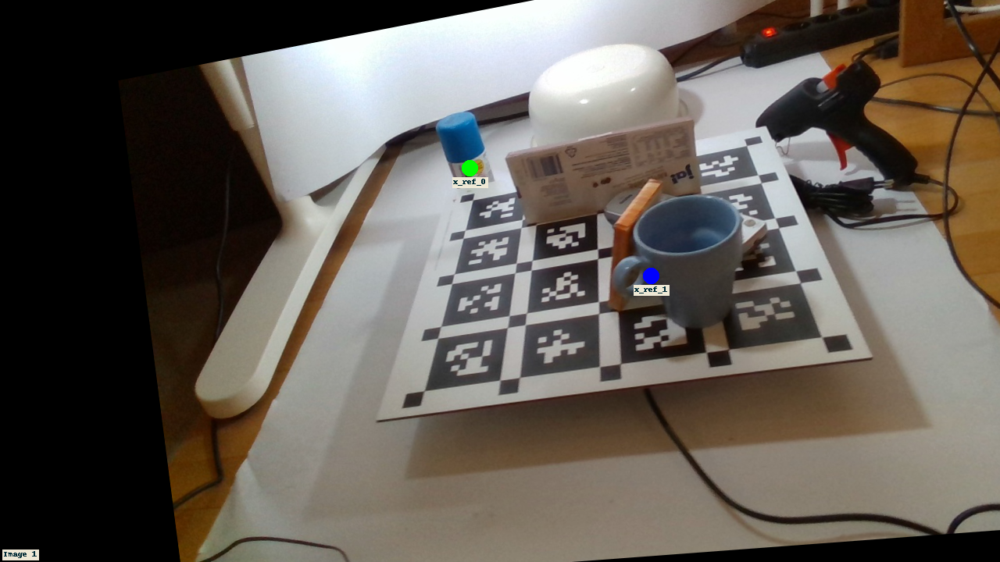

In [48]:
np3d(image_l_rect, markers=[{'xy_pos': x_ref_0_rect, 'desc': "x_ref_0", 'marker_color':color_0},
                            {'xy_pos': x_ref_1_rect, 'desc': "x_ref_1", 'marker_color':color_1}],
     text="Image 1", image_range_text_off=True)

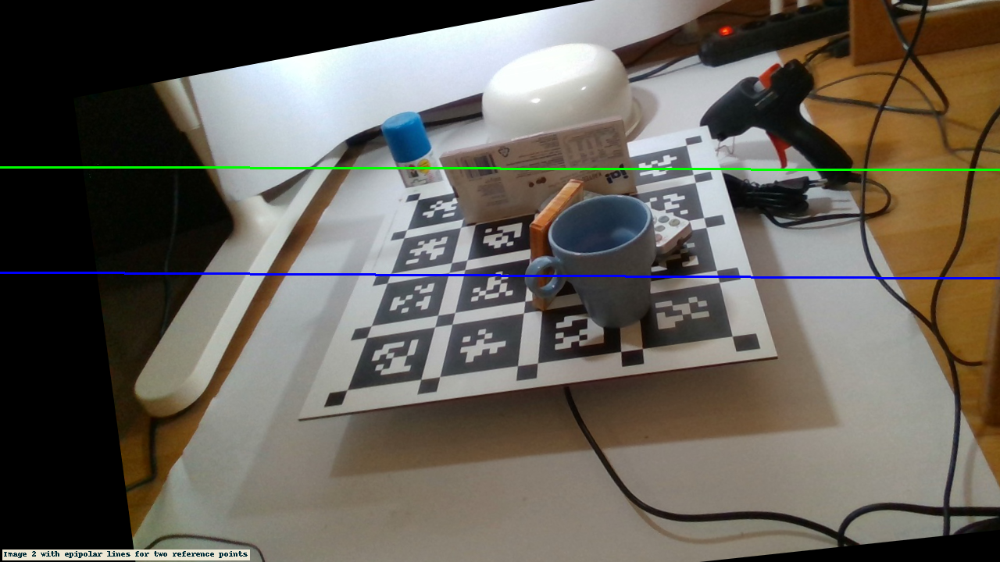

In [49]:
np3d(image_r_rect_epilines, text="Image 2 with epipolar lines for two reference points", image_range_text_off=True)